# Activation Maximization on VGGNet

## Dense Layer Visualizations

To visualize activation over final dense layer outputs, we need to switch the `softmax` activation out for `linear` since gradient of output node will depend on all the other node activations. Doing this in keras is tricky, so we provide `utils.apply_modifications` to modify network parameters and rebuild the graph.

If this swapping is not done, the results might be suboptimal. We will start by swapping out 'softmax' for 'linear' and compare what happens if we dont do this at the end.

In [1]:
from keras.applications import VGG16
from vis.utils import utils
from keras import activations

# Build the VGG16 network with ImageNet weights
model = VGG16(weights='imagenet', include_top=True)

# Utility to search for layer index by name. 
# Alternatively we can specify this as -1 since it corresponds to the last layer.
layer_idx = utils.find_layer_idx(model, 'predictions')

# Swap softmax with linear
model.layers[layer_idx].activation = activations.linear
model = utils.apply_modifications(model)

Using TensorFlow backend.
C:\Users\admin\Anaconda3\lib\site-packages\keras\models.py:245: UserWarning: No training configuration found in save file: the model was *not* compiled. Compile it manually.
  warnings.warn('No training configuration found in save file: '


### Visualizing a specific output category

Lets try visualizing a specific output category. We will pick `ouzel` which corresponds to imagenet category `20`

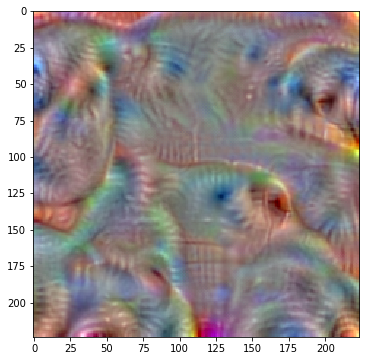

In [2]:
from vis.visualization import visualize_activation

from matplotlib import pyplot as plt
%matplotlib inline
plt.rcParams['figure.figsize'] = (18, 6)

# 20 is the imagenet category for 'ouzel'
img = visualize_activation(model, layer_idx, filter_indices=208)
plt.imshow(img)

Hmm, that sort of looks like a bird. Lets see if we can get better results with more iterations. This time, lets see the verbose output during the optimization process.

Iteration: 1, named_losses: [('ActivationMax Loss', 0.97141623),
 ('L-6.0 Norm Loss', 0.063258268),
 ('TV(2.0) Loss', 6431.5322)], overall loss: 6432.56689453125
Iteration: 2, named_losses: [('ActivationMax Loss', 0.79049647),
 ('L-6.0 Norm Loss', 0.062634453),
 ('TV(2.0) Loss', 3170.3511)], overall loss: 3171.2041015625
Iteration: 3, named_losses: [('ActivationMax Loss', 0.58269399),
 ('L-6.0 Norm Loss', 0.062289629),
 ('TV(2.0) Loss', 1654.5631)], overall loss: 1655.2081298828125
Iteration: 4, named_losses: [('ActivationMax Loss', 0.22189793),
 ('L-6.0 Norm Loss', 0.062079947),
 ('TV(2.0) Loss', 846.2395)], overall loss: 846.5234985351562
Iteration: 5, named_losses: [('ActivationMax Loss', -0.75232071),
 ('L-6.0 Norm Loss', 0.061954714),
 ('TV(2.0) Loss', 414.39957)], overall loss: 413.7091979980469
Iteration: 6, named_losses: [('ActivationMax Loss', -2.228792),
 ('L-6.0 Norm Loss', 0.0618819),
 ('TV(2.0) Loss', 216.3212)], overall loss: 214.15428161621094
Iteration: 7, named_losses:

Iteration: 51, named_losses: [('ActivationMax Loss', -34.876122),
 ('L-6.0 Norm Loss', 0.061853487),
 ('TV(2.0) Loss', 27.724331)], overall loss: -7.089935302734375
Iteration: 52, named_losses: [('ActivationMax Loss', -39.449348),
 ('L-6.0 Norm Loss', 0.061854906),
 ('TV(2.0) Loss', 25.749723)], overall loss: -13.63776969909668
Iteration: 53, named_losses: [('ActivationMax Loss', -34.507114),
 ('L-6.0 Norm Loss', 0.061856672),
 ('TV(2.0) Loss', 28.472267)], overall loss: -5.972991943359375
Iteration: 54, named_losses: [('ActivationMax Loss', -38.422012),
 ('L-6.0 Norm Loss', 0.061859582),
 ('TV(2.0) Loss', 25.59861)], overall loss: -12.761543273925781
Iteration: 55, named_losses: [('ActivationMax Loss', -37.630882),
 ('L-6.0 Norm Loss', 0.061862081),
 ('TV(2.0) Loss', 25.904926)], overall loss: -11.664093017578125
Iteration: 56, named_losses: [('ActivationMax Loss', -39.460823),
 ('L-6.0 Norm Loss', 0.061863963),
 ('TV(2.0) Loss', 25.940382)], overall loss: -13.458578109741211
Iteratio

Iteration: 101, named_losses: [('ActivationMax Loss', -57.405891),
 ('L-6.0 Norm Loss', 0.061962139),
 ('TV(2.0) Loss', 34.265808)], overall loss: -23.078121185302734
Iteration: 102, named_losses: [('ActivationMax Loss', -56.496853),
 ('L-6.0 Norm Loss', 0.061965242),
 ('TV(2.0) Loss', 33.679848)], overall loss: -22.75503921508789
Iteration: 103, named_losses: [('ActivationMax Loss', -58.354759),
 ('L-6.0 Norm Loss', 0.061968133),
 ('TV(2.0) Loss', 33.263851)], overall loss: -25.02893829345703
Iteration: 104, named_losses: [('ActivationMax Loss', -55.909645),
 ('L-6.0 Norm Loss', 0.061969269),
 ('TV(2.0) Loss', 33.181484)], overall loss: -22.66619110107422
Iteration: 105, named_losses: [('ActivationMax Loss', -59.88998),
 ('L-6.0 Norm Loss', 0.061972596),
 ('TV(2.0) Loss', 33.153492)], overall loss: -26.674514770507812
Iteration: 106, named_losses: [('ActivationMax Loss', -57.142193),
 ('L-6.0 Norm Loss', 0.061975535),
 ('TV(2.0) Loss', 33.053875)], overall loss: -24.02634048461914
Ite

Iteration: 151, named_losses: [('ActivationMax Loss', -72.275948),
 ('L-6.0 Norm Loss', 0.062090471),
 ('TV(2.0) Loss', 41.322922)], overall loss: -30.89093780517578
Iteration: 152, named_losses: [('ActivationMax Loss', -75.37191),
 ('L-6.0 Norm Loss', 0.062094301),
 ('TV(2.0) Loss', 40.983749)], overall loss: -34.32606506347656
Iteration: 153, named_losses: [('ActivationMax Loss', -74.64138),
 ('L-6.0 Norm Loss', 0.062096007),
 ('TV(2.0) Loss', 40.339821)], overall loss: -34.239463806152344
Iteration: 154, named_losses: [('ActivationMax Loss', -76.764885),
 ('L-6.0 Norm Loss', 0.062098481),
 ('TV(2.0) Loss', 40.326443)], overall loss: -36.376346588134766
Iteration: 155, named_losses: [('ActivationMax Loss', -73.65799),
 ('L-6.0 Norm Loss', 0.062101439),
 ('TV(2.0) Loss', 41.559887)], overall loss: -32.0359992980957
Iteration: 156, named_losses: [('ActivationMax Loss', -76.601265),
 ('L-6.0 Norm Loss', 0.062104236),
 ('TV(2.0) Loss', 40.871132)], overall loss: -35.66802978515625
Iterat

Iteration: 201, named_losses: [('ActivationMax Loss', -87.816864),
 ('L-6.0 Norm Loss', 0.062217705),
 ('TV(2.0) Loss', 45.276299)], overall loss: -42.47834777832031
Iteration: 202, named_losses: [('ActivationMax Loss', -84.383942),
 ('L-6.0 Norm Loss', 0.062220536),
 ('TV(2.0) Loss', 46.618649)], overall loss: -37.70307540893555
Iteration: 203, named_losses: [('ActivationMax Loss', -87.794357),
 ('L-6.0 Norm Loss', 0.06222181),
 ('TV(2.0) Loss', 45.836372)], overall loss: -41.89575958251953
Iteration: 204, named_losses: [('ActivationMax Loss', -88.159592),
 ('L-6.0 Norm Loss', 0.062225409),
 ('TV(2.0) Loss', 47.578583)], overall loss: -40.51878356933594
Iteration: 205, named_losses: [('ActivationMax Loss', -88.599762),
 ('L-6.0 Norm Loss', 0.062227972),
 ('TV(2.0) Loss', 47.090401)], overall loss: -41.44713592529297
Iteration: 206, named_losses: [('ActivationMax Loss', -88.90831),
 ('L-6.0 Norm Loss', 0.062229931),
 ('TV(2.0) Loss', 47.677921)], overall loss: -41.168155670166016
Itera

Iteration: 251, named_losses: [('ActivationMax Loss', -95.060417),
 ('L-6.0 Norm Loss', 0.062342476),
 ('TV(2.0) Loss', 49.996887)], overall loss: -45.001190185546875
Iteration: 252, named_losses: [('ActivationMax Loss', -89.965355),
 ('L-6.0 Norm Loss', 0.062344443),
 ('TV(2.0) Loss', 49.623409)], overall loss: -40.279598236083984
Iteration: 253, named_losses: [('ActivationMax Loss', -94.512901),
 ('L-6.0 Norm Loss', 0.062347665),
 ('TV(2.0) Loss', 49.581512)], overall loss: -44.869041442871094
Iteration: 254, named_losses: [('ActivationMax Loss', -91.515976),
 ('L-6.0 Norm Loss', 0.062349256),
 ('TV(2.0) Loss', 48.764591)], overall loss: -42.68903732299805
Iteration: 255, named_losses: [('ActivationMax Loss', -93.680359),
 ('L-6.0 Norm Loss', 0.062353209),
 ('TV(2.0) Loss', 48.607632)], overall loss: -45.010372161865234
Iteration: 256, named_losses: [('ActivationMax Loss', -92.872772),
 ('L-6.0 Norm Loss', 0.062354352),
 ('TV(2.0) Loss', 48.47126)], overall loss: -44.33915710449219
I

Iteration: 301, named_losses: [('ActivationMax Loss', -97.041908),
 ('L-6.0 Norm Loss', 0.062461123),
 ('TV(2.0) Loss', 51.089325)], overall loss: -45.89012145996094
Iteration: 302, named_losses: [('ActivationMax Loss', -100.96075),
 ('L-6.0 Norm Loss', 0.062464595),
 ('TV(2.0) Loss', 51.016479)], overall loss: -49.881813049316406
Iteration: 303, named_losses: [('ActivationMax Loss', -97.390915),
 ('L-6.0 Norm Loss', 0.062467217),
 ('TV(2.0) Loss', 51.244896)], overall loss: -46.08354949951172
Iteration: 304, named_losses: [('ActivationMax Loss', -101.27479),
 ('L-6.0 Norm Loss', 0.062470376),
 ('TV(2.0) Loss', 50.154388)], overall loss: -51.05792999267578
Iteration: 305, named_losses: [('ActivationMax Loss', -98.859833),
 ('L-6.0 Norm Loss', 0.062471345),
 ('TV(2.0) Loss', 50.71236)], overall loss: -48.08500289916992
Iteration: 306, named_losses: [('ActivationMax Loss', -97.486641),
 ('L-6.0 Norm Loss', 0.062475123),
 ('TV(2.0) Loss', 51.022678)], overall loss: -46.401485443115234
Ite

Iteration: 351, named_losses: [('ActivationMax Loss', -100.96413),
 ('L-6.0 Norm Loss', 0.062578529),
 ('TV(2.0) Loss', 51.805187)], overall loss: -49.096370697021484
Iteration: 352, named_losses: [('ActivationMax Loss', -104.19855),
 ('L-6.0 Norm Loss', 0.062583208),
 ('TV(2.0) Loss', 53.837906)], overall loss: -50.298057556152344
Iteration: 353, named_losses: [('ActivationMax Loss', -102.54213),
 ('L-6.0 Norm Loss', 0.062583096),
 ('TV(2.0) Loss', 52.72509)], overall loss: -49.75445556640625
Iteration: 354, named_losses: [('ActivationMax Loss', -104.47378),
 ('L-6.0 Norm Loss', 0.062587343),
 ('TV(2.0) Loss', 52.638504)], overall loss: -51.77268981933594
Iteration: 355, named_losses: [('ActivationMax Loss', -103.96056),
 ('L-6.0 Norm Loss', 0.062588513),
 ('TV(2.0) Loss', 52.503098)], overall loss: -51.394866943359375
Iteration: 356, named_losses: [('ActivationMax Loss', -105.83009),
 ('L-6.0 Norm Loss', 0.062593691),
 ('TV(2.0) Loss', 53.032692)], overall loss: -52.73480224609375
It

Iteration: 401, named_losses: [('ActivationMax Loss', -109.3108),
 ('L-6.0 Norm Loss', 0.062699236),
 ('TV(2.0) Loss', 55.86681)], overall loss: -53.381290435791016
Iteration: 402, named_losses: [('ActivationMax Loss', -105.72741),
 ('L-6.0 Norm Loss', 0.062703282),
 ('TV(2.0) Loss', 55.159447)], overall loss: -50.50525665283203
Iteration: 403, named_losses: [('ActivationMax Loss', -107.89124),
 ('L-6.0 Norm Loss', 0.062703572),
 ('TV(2.0) Loss', 56.728516)], overall loss: -51.10002136230469
Iteration: 404, named_losses: [('ActivationMax Loss', -106.97041),
 ('L-6.0 Norm Loss', 0.062708952),
 ('TV(2.0) Loss', 55.729668)], overall loss: -51.17803955078125
Iteration: 405, named_losses: [('ActivationMax Loss', -109.42888),
 ('L-6.0 Norm Loss', 0.062708601),
 ('TV(2.0) Loss', 56.222954)], overall loss: -53.143218994140625
Iteration: 406, named_losses: [('ActivationMax Loss', -105.79642),
 ('L-6.0 Norm Loss', 0.062714331),
 ('TV(2.0) Loss', 56.229706)], overall loss: -49.503997802734375
Ite

Iteration: 451, named_losses: [('ActivationMax Loss', -114.20942),
 ('L-6.0 Norm Loss', 0.062821075),
 ('TV(2.0) Loss', 56.202126)], overall loss: -57.94447326660156
Iteration: 452, named_losses: [('ActivationMax Loss', -105.47456),
 ('L-6.0 Norm Loss', 0.062825598),
 ('TV(2.0) Loss', 57.156342)], overall loss: -48.255393981933594
Iteration: 453, named_losses: [('ActivationMax Loss', -111.92435),
 ('L-6.0 Norm Loss', 0.062826641),
 ('TV(2.0) Loss', 56.216873)], overall loss: -55.64464569091797
Iteration: 454, named_losses: [('ActivationMax Loss', -104.69746),
 ('L-6.0 Norm Loss', 0.062828578),
 ('TV(2.0) Loss', 55.559486)], overall loss: -49.07514190673828
Iteration: 455, named_losses: [('ActivationMax Loss', -111.02028),
 ('L-6.0 Norm Loss', 0.062832452),
 ('TV(2.0) Loss', 56.535641)], overall loss: -54.42180252075195
Iteration: 456, named_losses: [('ActivationMax Loss', -104.58205),
 ('L-6.0 Norm Loss', 0.062834106),
 ('TV(2.0) Loss', 56.202034)], overall loss: -48.317176818847656
It

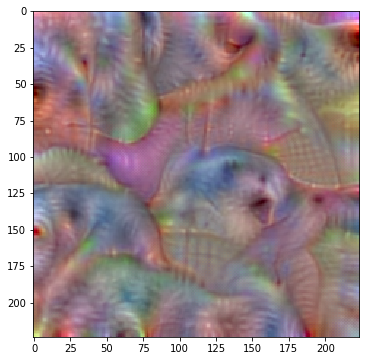

In [3]:
# 20 is the imagenet category for 'ouzel'
img = visualize_activation(model, layer_idx, filter_indices=208, max_iter=500, verbose=True)
plt.imshow(img)

We can see that the loss appears to be converging. So more iterations definitely seem to give better output. One way to get crisper results is to use `Jitter` input_modifier. As the name suggests, `Jitter` moves pixels around in the image. Lets try this out.

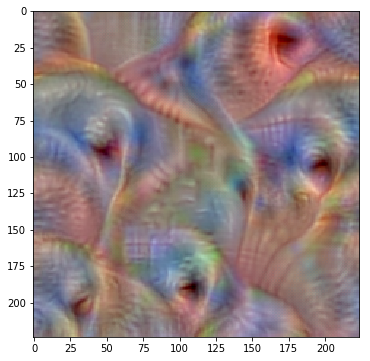

In [4]:
from vis.input_modifiers import Jitter

# 20 is the imagenet category for 'ouzel'
# Jitter 16 pixels along all dimensions to during the optimization process.
img = visualize_activation(model, layer_idx, filter_indices=208, max_iter=500, input_modifiers=[Jitter(16)])
plt.imshow(img)

Look at that! Not only has the conv net captured what it means to be an ouzel, but it also seems to encode for different orientations and scales, a further proof of rotational and scale invariance. 

Lets try this for a bunch of other random categories. This will take a while. Go grab a nice cup of coffee and prepare to be amused :)

Failed to lookup font 'FreeSans.ttf', falling back to default
Failed to lookup font 'FreeSans.ttf', falling back to default
Failed to lookup font 'FreeSans.ttf', falling back to default
Failed to lookup font 'FreeSans.ttf', falling back to default
Failed to lookup font 'FreeSans.ttf', falling back to default
Failed to lookup font 'FreeSans.ttf', falling back to default
Failed to lookup font 'FreeSans.ttf', falling back to default
Failed to lookup font 'FreeSans.ttf', falling back to default
Failed to lookup font 'FreeSans.ttf', falling back to default
Failed to lookup font 'FreeSans.ttf', falling back to default
Failed to lookup font 'FreeSans.ttf', falling back to default
Failed to lookup font 'FreeSans.ttf', falling back to default
Failed to lookup font 'FreeSans.ttf', falling back to default
Failed to lookup font 'FreeSans.ttf', falling back to default
Failed to lookup font 'FreeSans.ttf', falling back to default


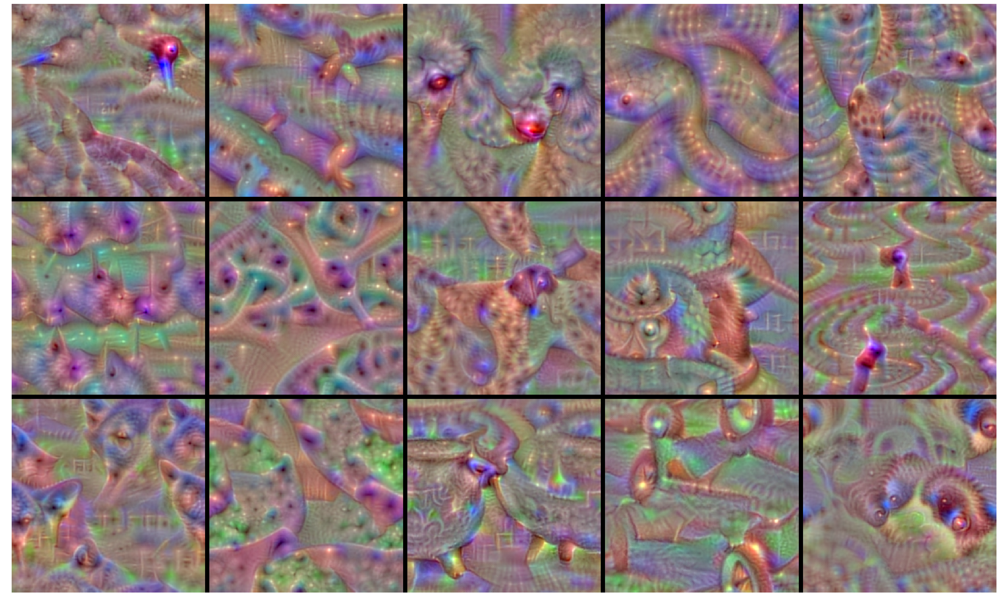

In [7]:
import numpy as np
categories = np.random.permutation(1000)[:15]

vis_images = []
image_modifiers = [Jitter(16)]
for idx in categories:    
    img = visualize_activation(model, layer_idx, filter_indices=idx, max_iter=500, input_modifiers=image_modifiers)
    
    # Reverse lookup index to imagenet label and overlay it on the image.
    img = utils.draw_text(img, utils.lookup_imagenet_labels(idx))
    vis_images.append(img)

# Generate stitched images with 5 cols (so it will have 3 rows).
plt.rcParams['figure.figsize'] = (50, 50)
stitched = utils.stitch_images(vis_images, cols=5)
plt.axis('off')
plt.imshow(stitched)
plt.show()

Some of them make sense if you stare at ot for a while. There are ways of improving this. We will cover some ideas for this in the next section. You can come back here and try those out as an exercise.

## Visualizing Conv filters

In a CNN, each Conv layer has several learned *template matching* filters that maximize their output when a similar 
template pattern is found in the input image. First Conv layer is easy to interpret; simply visualize the weights as an image. To see what the Conv layer is doing, a simple option is to apply the filter over raw input pixels. 
Subsequent Conv filters operate over the outputs of previous Conv filters (which indicate the presence or absence 
of some templates), making them hard to interpret.

One way of interpreting them is to generate an input image that maximizes the filter output. This allows us to generate an input that activates the filter.

Lets start by visualizing the second conv layer of vggnet (named as 'block1_conv2'). Here is the VGG16 model for reference.

In [8]:
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0         
__________

In [9]:
from vis.visualization import get_num_filters

# The name of the layer we want to visualize
# You can see this in the model definition.
layer_name = 'block1_conv2'
layer_idx = utils.find_layer_idx(model, layer_name)

# Visualize all filters in this layer.
filters = np.arange(get_num_filters(model.layers[layer_idx]))

# Generate input image for each filter.
vis_images = []
for idx in filters:
    img = visualize_activation(model, layer_idx, filter_indices=idx)
    
    # Utility to overlay text on image.
    img = utils.draw_text(img, 'Filter {}'.format(idx))    
    vis_images.append(img)

# Generate stitched image palette with 8 cols.
stitched = utils.stitch_images(vis_images, cols=8)    
plt.axis('off')
plt.imshow(stitched)
plt.title(layer_name)
plt.show()

Failed to lookup font 'FreeSans.ttf', falling back to default
Failed to lookup font 'FreeSans.ttf', falling back to default
Failed to lookup font 'FreeSans.ttf', falling back to default
Failed to lookup font 'FreeSans.ttf', falling back to default
Failed to lookup font 'FreeSans.ttf', falling back to default
Failed to lookup font 'FreeSans.ttf', falling back to default
Failed to lookup font 'FreeSans.ttf', falling back to default
Failed to lookup font 'FreeSans.ttf', falling back to default
Failed to lookup font 'FreeSans.ttf', falling back to default
Failed to lookup font 'FreeSans.ttf', falling back to default
Failed to lookup font 'FreeSans.ttf', falling back to default
Failed to lookup font 'FreeSans.ttf', falling back to default
Failed to lookup font 'FreeSans.ttf', falling back to default
Failed to lookup font 'FreeSans.ttf', falling back to default
Failed to lookup font 'FreeSans.ttf', falling back to default
Failed to lookup font 'FreeSans.ttf', falling back to default
Failed t

They mostly seem to match for specific color and directional patterns. Lets try a bunch of other layers.
We will randomly visualize 10 filters within various layers.

Failed to lookup font 'FreeSans.ttf', falling back to default
Failed to lookup font 'FreeSans.ttf', falling back to default
Failed to lookup font 'FreeSans.ttf', falling back to default
Failed to lookup font 'FreeSans.ttf', falling back to default
Failed to lookup font 'FreeSans.ttf', falling back to default
Failed to lookup font 'FreeSans.ttf', falling back to default
Failed to lookup font 'FreeSans.ttf', falling back to default
Failed to lookup font 'FreeSans.ttf', falling back to default
Failed to lookup font 'FreeSans.ttf', falling back to default
Failed to lookup font 'FreeSans.ttf', falling back to default


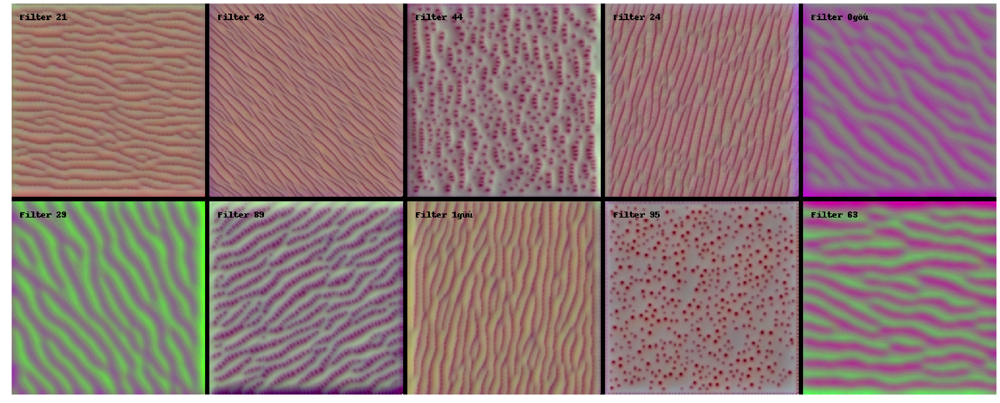

Failed to lookup font 'FreeSans.ttf', falling back to default
Failed to lookup font 'FreeSans.ttf', falling back to default
Failed to lookup font 'FreeSans.ttf', falling back to default
Failed to lookup font 'FreeSans.ttf', falling back to default
Failed to lookup font 'FreeSans.ttf', falling back to default
Failed to lookup font 'FreeSans.ttf', falling back to default
Failed to lookup font 'FreeSans.ttf', falling back to default
Failed to lookup font 'FreeSans.ttf', falling back to default
Failed to lookup font 'FreeSans.ttf', falling back to default
Failed to lookup font 'FreeSans.ttf', falling back to default


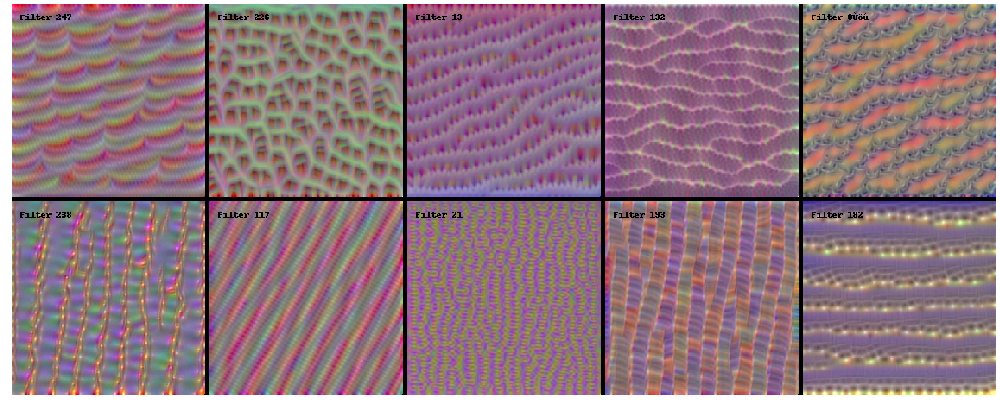

Failed to lookup font 'FreeSans.ttf', falling back to default
Failed to lookup font 'FreeSans.ttf', falling back to default
Failed to lookup font 'FreeSans.ttf', falling back to default
Failed to lookup font 'FreeSans.ttf', falling back to default
Failed to lookup font 'FreeSans.ttf', falling back to default
Failed to lookup font 'FreeSans.ttf', falling back to default
Failed to lookup font 'FreeSans.ttf', falling back to default
Failed to lookup font 'FreeSans.ttf', falling back to default
Failed to lookup font 'FreeSans.ttf', falling back to default
Failed to lookup font 'FreeSans.ttf', falling back to default


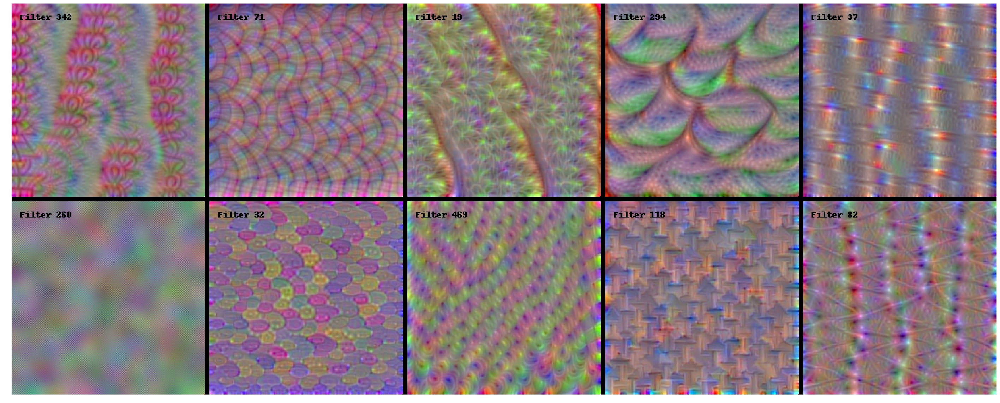

Failed to lookup font 'FreeSans.ttf', falling back to default
Failed to lookup font 'FreeSans.ttf', falling back to default
Failed to lookup font 'FreeSans.ttf', falling back to default
Failed to lookup font 'FreeSans.ttf', falling back to default
Failed to lookup font 'FreeSans.ttf', falling back to default
Failed to lookup font 'FreeSans.ttf', falling back to default
Failed to lookup font 'FreeSans.ttf', falling back to default
Failed to lookup font 'FreeSans.ttf', falling back to default
Failed to lookup font 'FreeSans.ttf', falling back to default
Failed to lookup font 'FreeSans.ttf', falling back to default


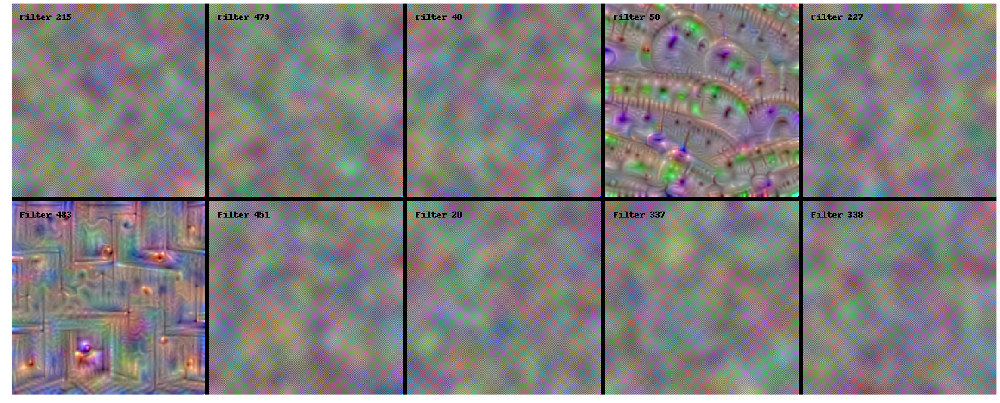

In [10]:
selected_indices = []
for layer_name in ['block2_conv2', 'block3_conv3', 'block4_conv3', 'block5_conv3']:
    layer_idx = utils.find_layer_idx(model, layer_name)

    # Visualize all filters in this layer.
    filters = np.random.permutation(get_num_filters(model.layers[layer_idx]))[:10]
    selected_indices.append(filters)

    # Generate input image for each filter.
    vis_images = []
    for idx in filters:
        img = visualize_activation(model, layer_idx, filter_indices=idx)

        # Utility to overlay text on image.
        img = utils.draw_text(img, 'Filter {}'.format(idx))    
        vis_images.append(img)

    # Generate stitched image palette with 5 cols so we get 2 rows.
    stitched = utils.stitch_images(vis_images, cols=5)    
    plt.figure()
    plt.axis('off')
    plt.imshow(stitched)
    plt.show()

We can see how filters evolved to look for simple -> complex abstract patterns.

We also notice that some of the filters in `block5_conv3` (the last one) failed to converge.  This is usually because regularization losses (total variation and LP norm) are overtaking activation maximization loss (set verbose=True to observe). There are a couple of options to make this work better,

- Different regularization weights.
- Increase number of iterations.
- Add `Jitter` input_modifier.
- Try with 0 regularization weights, generate a converged image and use that as `seed_input` with regularization enabled.

I will show a subset of these ideas here. Lets start by adidng Jitter and disabling total variation.

Failed to lookup font 'FreeSans.ttf', falling back to default
Failed to lookup font 'FreeSans.ttf', falling back to default
Failed to lookup font 'FreeSans.ttf', falling back to default
Failed to lookup font 'FreeSans.ttf', falling back to default
Failed to lookup font 'FreeSans.ttf', falling back to default
Failed to lookup font 'FreeSans.ttf', falling back to default
Failed to lookup font 'FreeSans.ttf', falling back to default
Failed to lookup font 'FreeSans.ttf', falling back to default
Failed to lookup font 'FreeSans.ttf', falling back to default
Failed to lookup font 'FreeSans.ttf', falling back to default


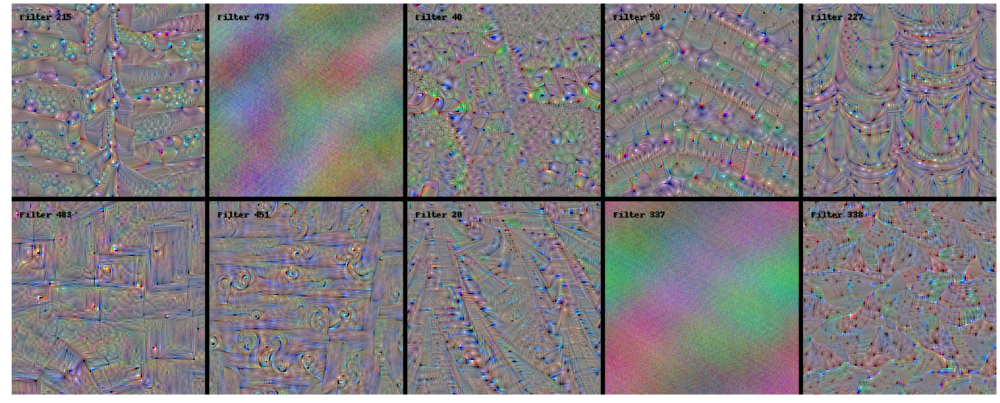

In [11]:
layer_idx = utils.find_layer_idx(model, 'block5_conv3')

# We need to select the same random filters in order to compare the results.
filters = selected_indices[-1]
selected_indices.append(filters)

# Generate input image for each filter.
vis_images = []
for idx in filters:
    # We will jitter 5% relative to the image size.
    img = visualize_activation(model, layer_idx, filter_indices=idx, 
                               tv_weight=0.,
                               input_modifiers=[Jitter(0.05)])

    # Utility to overlay text on image.
    img = utils.draw_text(img, 'Filter {}'.format(idx))    
    vis_images.append(img)

# Generate stitched image palette with 5 cols so we get 2 rows.
stitched = utils.stitch_images(vis_images, cols=5)    
plt.figure()
plt.axis('off')
plt.imshow(stitched)
plt.show()

We can see how previously unconverged filters show something this time. Lets take a specific output from here and use it as a `seed_input` with total_variation enabled this time.

Failed to lookup font 'FreeSans.ttf', falling back to default
Failed to lookup font 'FreeSans.ttf', falling back to default
Failed to lookup font 'FreeSans.ttf', falling back to default
Failed to lookup font 'FreeSans.ttf', falling back to default
Failed to lookup font 'FreeSans.ttf', falling back to default
Failed to lookup font 'FreeSans.ttf', falling back to default
Failed to lookup font 'FreeSans.ttf', falling back to default
Failed to lookup font 'FreeSans.ttf', falling back to default
Failed to lookup font 'FreeSans.ttf', falling back to default
Failed to lookup font 'FreeSans.ttf', falling back to default


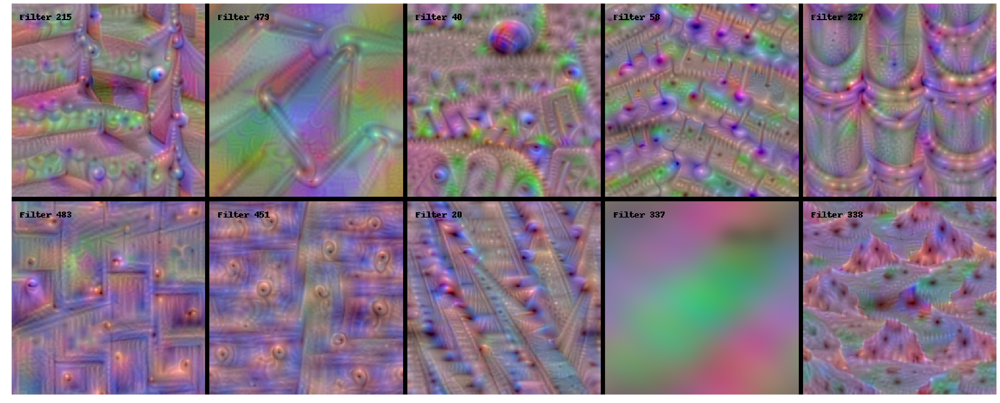

In [12]:
# Generate input image for each filter.
new_vis_images = []
for i, idx in enumerate(filters):
    # We will seed with optimized image this time.
    img = visualize_activation(model, layer_idx, filter_indices=idx, 
                               seed_input=vis_images[i],
                               input_modifiers=[Jitter(0.05)])

    # Utility to overlay text on image.
    img = utils.draw_text(img, 'Filter {}'.format(idx))    
    new_vis_images.append(img)

# Generate stitched image palette with 5 cols so we get 2 rows.
stitched = utils.stitch_images(new_vis_images, cols=5)    
plt.figure()
plt.axis('off')
plt.imshow(stitched)
plt.show()

And that, folks, is how we roll :)
This trick works pretty well to get those stubborn filters to converge.

## Other fun stuff

The API to `visualize_activation` accepts `filter_indices`. This is generally meant for *multi label* classifiers, but nothing prevents us from having some fun. 

By setting `filter_indices`, to multiple output categories, we can generate an input that the network thinks is both those categories. Maybe we can generate a cool looking crab fish. I will leave this as an exersice to the reader. You mgith have to experiment with regularization weights a lot.

Ideally, we can use a GAN trained on imagenet and use the discriminator loss as a regularizer. This is easily done using `visualize_activations_with_losses` API. If you ever do this, please consider submitting a PR :)

## Visualizations without swapping softmax

As alluded at the beginning of the tutorial, we want to compare and see what happens if we didnt swap out softmax for linear activation.

Lets try the `ouzel` visualization again.

C:\Users\admin\Anaconda3\lib\site-packages\keras\models.py:245: UserWarning: No training configuration found in save file: the model was *not* compiled. Compile it manually.
  warnings.warn('No training configuration found in save file: '


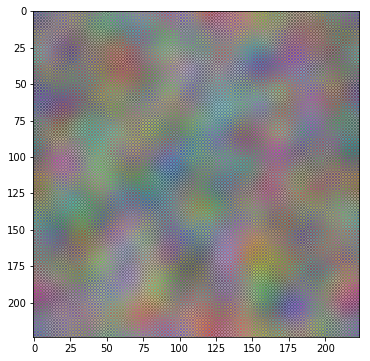

In [13]:
layer_idx = utils.find_layer_idx(model, 'predictions')

# Swap linear back with softmax
model.layers[layer_idx].activation = activations.softmax
model = utils.apply_modifications(model)

img = visualize_activation(model, layer_idx, filter_indices=208, input_modifiers=[Jitter(16)])
plt.rcParams['figure.figsize'] = (18, 6)
plt.imshow(img)

It does not work! The reason is that maximizing an output node can be done by minimizing other outputs. Softmax is weird that way. It is the only activation that depends on other node output(s) in the layer.